# Load libraries

In [1]:
%load_ext autoreload
%autoreload 2

from dataloader import train_test_val_split,CIFAR10Dataset,transformation,my_dataloader
from models import MyResNet18,KNN_classifier
from learning.learning_circle import trainer as trainer_circle
from learning.learning import trainer
from plots import plot_umap,plot_train_val_metric,plot_images
from learning.embeddings import get_backbone_embedding,get_umap_embedding, dataloaders_embedding
from util import load_model_params
from learning import Inference_mode
import torch        
import torch.nn as nn
from pytorch_metric_learning.losses import  AngularLoss

# from util.circle_loss import CircleLoss


/root/farshad/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
!mkdir -p data/CIFAR10
!mkdir -p ckpts/classifier ckpts/robust_classifier ckpts/angular ckpt/angular_classifier
!git clone https://github.com/YoongiKim/CIFAR-10-images data/CIFAR10/

Cloning into 'data/CIFAR10'...
remote: Enumerating objects: 60027, done.
remote: Total 60027 (delta 0), reused 0 (delta 0), pack-reused 60027
Receiving objects: 100% (60027/60027), 19.94 MiB | 56.88 MiB/s, done.
Resolving deltas: 100% (59990/59990), done.
Updating files: 100% (60001/60001), done.


## Part1 - Split paths with balanced class consideration

### Define Dataloaders

In [2]:
train_paths,val_paths,test_paths = train_test_val_split(root1 = "./data/CIFAR10/train/",
                                                        root2 = "./data/CIFAR10/test/",
                                                        split_percentage = 20)

## Parameters
# batch_size = 256
n_classes = 10
n_samples_per_class = 50


## Clean Random datasets
train_dataset_clean = CIFAR10Dataset(imgs_paths = train_paths,
                               transforms=transformation.default_cifar10_transforms(to_augment_data=False))
val_dataset_clean = CIFAR10Dataset(imgs_paths = val_paths,
                               transforms=transformation.default_cifar10_transforms(to_augment_data=False))
test_dataset_clean = CIFAR10Dataset(imgs_paths = test_paths,
                               transforms=transformation.default_cifar10_transforms(to_augment_data=False))


train_loader_clean = my_dataloader(train_dataset_clean,
                            to_sampling_random=False,
                            kwargs_random = None,
                            kwargs_balanced={"n_classes":n_classes,
                                             "n_samples":n_samples_per_class})
val_loader_clean = my_dataloader(val_dataset_clean,
                            to_sampling_random=False,
                            kwargs_random = None,
                            kwargs_balanced={"n_classes":n_classes,
                                             "n_samples":n_samples_per_class})
test_loader_clean = my_dataloader(test_dataset_clean,
                            to_sampling_random=False,
                            kwargs_random = None,
                            kwargs_balanced={"n_classes":n_classes,
                                             "n_samples":n_samples_per_class})



## Corropted datasets
train_dataset_corropted = CIFAR10Dataset(imgs_paths = train_paths,
                               transforms=transformation.default_cifar10_transforms(to_augment_data=True))
val_dataset_corropted = CIFAR10Dataset(imgs_paths = val_paths,
                               transforms=transformation.default_cifar10_transforms(to_augment_data=True))
test_dataset_corropted = CIFAR10Dataset(imgs_paths = test_paths,
                               transforms=transformation.default_cifar10_transforms(to_augment_data=True))



train_loader_corropted = my_dataloader(train_dataset_corropted,
                            to_sampling_random=False,
                            kwargs_random = None,
                            kwargs_balanced={"n_classes":n_classes,
                                             "n_samples":n_samples_per_class})
val_loader_corropted = my_dataloader(val_dataset_corropted,
                            to_sampling_random=False,
                            kwargs_random = None,
                            kwargs_balanced={"n_classes":n_classes,
                                             "n_samples":n_samples_per_class})
test_loader_corropted = my_dataloader(test_dataset_corropted,
                            to_sampling_random=False,
                            kwargs_random = None,
                            kwargs_balanced={"n_classes":n_classes,
                                             "n_samples":n_samples_per_class})


In [9]:

from util import load_model

In [3]:
from util import load_model

resnet18_classifier = MyResNet18()
# resnet18_classifier,_ = load_model(ckpt_path="./ckpts/classifier/ckpt_resnet18_classifier_epoch100.pth",
#                                    model=resnet18_classifier)

In [ ]:
plot_images(dataloader = train_loader_clean,
            dataloader_title = "Train clean images",
            model=resnet18_classifier,
            model_name=None,
            epsilon=None)

In [ ]:
plot_images(dataloader = val_loader_clean,
            dataloader_title = "Validation clean images",
            model=resnet18_classifier,
            model_name=None,
            epsilon=None)

In [ ]:
plot_images(dataloader = test_loader_clean,
            dataloader_title = "Test clean images",
            model=resnet18_robust_classifier,
            model_name=None,
            epsilon=None)

## Part2

In [3]:

epochs = 100
learning_rate = 1e-3
gamma=0.95
ckpt_save_freq = 10
embedding = False
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [4]:
epochs = 100
learning_rate = 1e-3
gamma=0.95
ckpt_save_freq = 10
embedding = False
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

resnet18_classifier = MyResNet18()
criterion = nn.CrossEntropyLoss()
# criterion = CircleLoss(m=0.25, gamma=80)


resnet18_classifier, resnet18_optimizer_classifier, resnet18_report_classifier = trainer(
                                                                                        train_loader=train_loader_clean,
                                                                                        val_loader=val_loader_clean,
                                                                                        model = resnet18_classifier,
                                                                                        embedding = embedding,
                                                                                        epsilon=None,
                                                                                        criterion=criterion,
                                                                                        model_name="resnet18_classifier",
                                                                                        epochs=epochs,
                                                                                        learning_rate=learning_rate,
                                                                                        gamma = gamma,
                                                                                        device=device,
                                                                                        load_saved_model=False,
                                                                                        ckpt_save_freq=ckpt_save_freq,
                                                                                        ckpt_save_root="./ckpts/classifier/",
                                                                                        ckpt_load_path=None,
                                                                                        report_root="./reports")

Train - iteration : 1:   5%|▌         | 1/20 [00:00<00:10,  1.90it/s, avg_train_loss_till_current_batch=2.5740, loss_batch=2.5740, max_len=2, top1_accuracy_train=10.8000]

val:   0%|          | 0/80 [00:00<?, ?it/s]/root/farshad/robust_classifier/learning/learning.py:172: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  report.loc[len(report)] = new_row.values[0]
train:   0%|          | 0/20 [00:00<?, ?it/s]t]/root/farshad/robust_classifier/learning/learning.py:115: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  report.loc[len(report)] = new_row.values[0]
Train - iteration : 2:   5%|▌         | 1/20 [00:00<00:02,  6.44it/s, avg_train_loss_till_current_batch=1.4250, lo

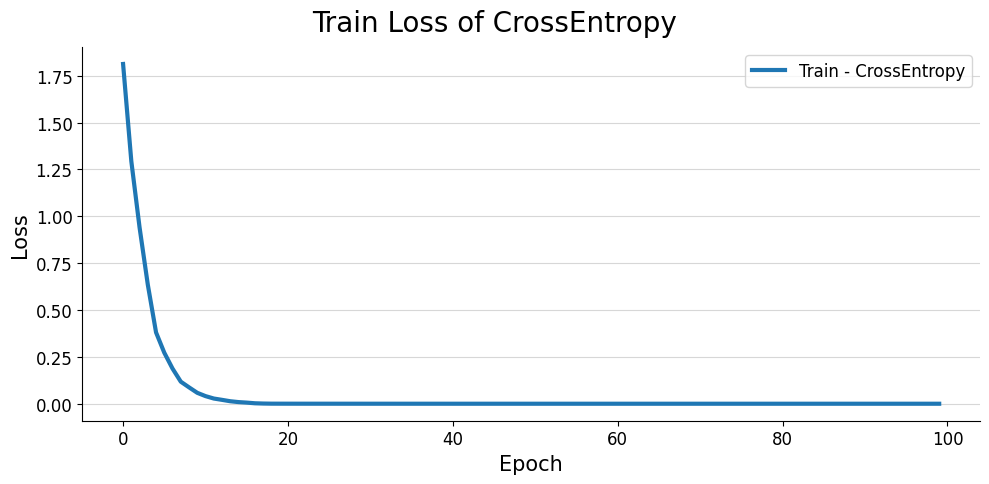

In [5]:
plot_train_val_metric(report_path = "./reports/resnet18_classifier_report.csv",
                      model_name="CrossEntropy",
                      metric_name="Loss",
                      lst_train_val_cols = ["avg_train_loss_till_current_batch","avg_val_loss_till_current_batch"],
                      figsize=(10,5),
                      linewidth_plot=3,
                      title=None,
                      title_fontsize=20,
                      title_padding=0.96,
                      xy_ticks_fontsize=12,
                      xylabel_fontsize=15,
                      legend_fontsize=12,
                      ylim=None)

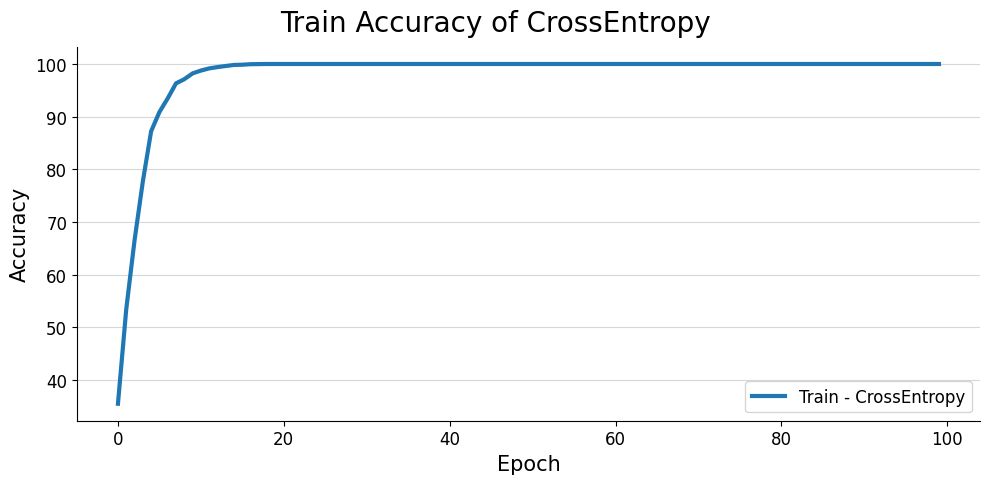

In [6]:
plot_train_val_metric(report_path = "./reports/resnet18_classifier_report.csv",
                      model_name="CrossEntropy",
                      metric_name="Accuracy",
                      lst_train_val_cols = ["avg_train_top1_acc_till_current_batch","avg_val_top1_acc_till_current_batch"],
                      figsize=(10,5),
                      linewidth_plot=3,
                      title=None,
                      title_fontsize=20,
                      title_padding=0.96,
                      xy_ticks_fontsize=12,
                      xylabel_fontsize=15,
                      legend_fontsize=12,
                      ylim=None)

 22%|██▎       | 18/80 [00:02<00:08,  7.23it/s]

100%|██████████| 20/20 [00:02<00:00,  7.18it/s]
/root/farshad/.venv/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


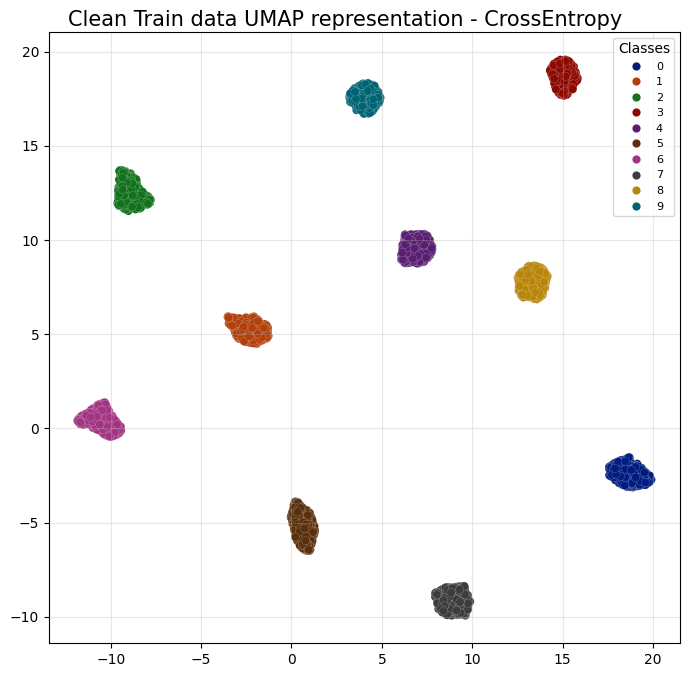

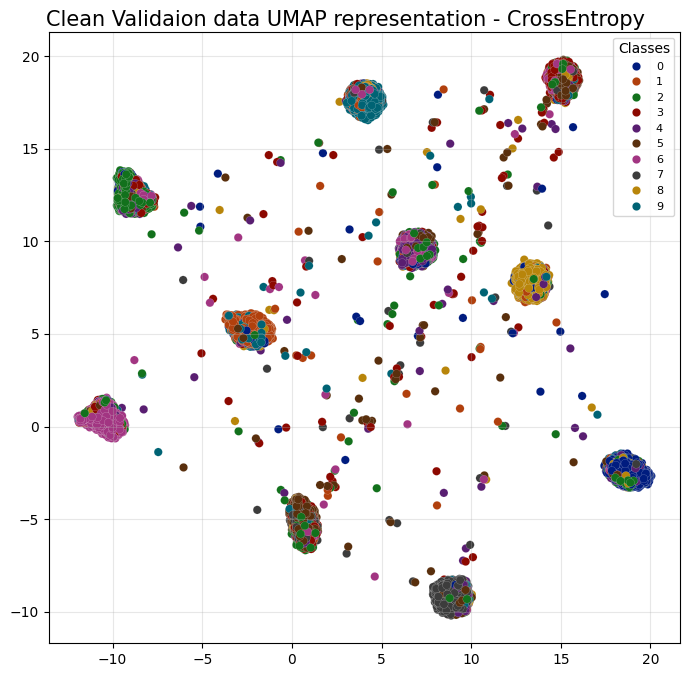

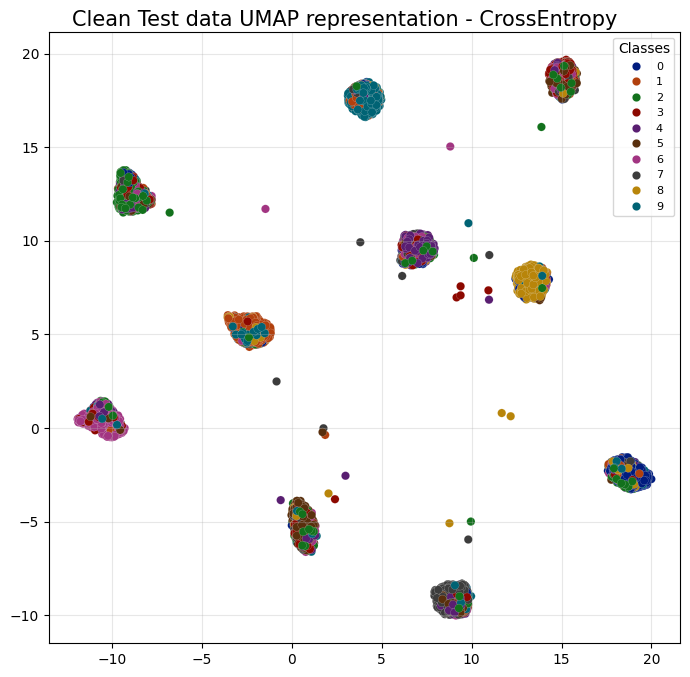

In [7]:
umap_clean_train_embeddings_resnet18_ce,labels_clean_train_resnet18_ce,\
umap_clean_val_embeddings_resnet18_ce,labels_clean_val_resnet18_ce,\
umap_clean_test_embeddings_resnet18_ce,labels_clean_test_resnet18_ce = dataloaders_embedding(
                                                                             model = resnet18_classifier,
                                                                             to_get_umap_representation = True,
                                                                             train_loader = train_loader_clean,
                                                                             val_loader = val_loader_clean,
                                                                             test_loader = test_loader_clean,
                                                                             device = device,
                                                                             train_epsilon=None,
                                                                             test_epsilon=None)

plot_umap(model_name="CrossEntropy",
          data_title="Clean Train data",
        embeddings_2d = umap_clean_train_embeddings_resnet18_ce,
        labels = labels_clean_train_resnet18_ce,
        figsize=(7,7),
        title_fontsize=15,
        title_padding=0.96,
        legend_fontsize=8)

plot_umap(model_name="CrossEntropy",
          data_title="Clean Validaion data",
        embeddings_2d = umap_clean_val_embeddings_resnet18_ce,
        labels = labels_clean_val_resnet18_ce,
        figsize=(7,7),
        title_fontsize=15,
        title_padding=0.96,
        legend_fontsize=8)

plot_umap(model_name="CrossEntropy",
          data_title="Clean Test data",
        embeddings_2d = umap_clean_test_embeddings_resnet18_ce,
        labels = labels_clean_test_resnet18_ce,
        figsize=(7,7),
        title_fontsize=15,
        title_padding=0.96,
        legend_fontsize=8)

In [8]:
Inference_mode(model = resnet18_classifier, 
               dataloader= val_loader_clean,
               dataloader_title="Clean Validation dataloader",
               device=device,
               criterion=nn.CrossEntropyLoss(),
               embedding=False,
               epsilon=None)

Inference mode: :   4%|▍         | 3/80 [00:00<00:10,  7.14it/s, avg_val_loss_till_current_batch=2.5390, loss_batch=2.5923, top1_accuracy_val=57.2000]

Inference mode: : 100%|██████████| 80/80 [00:11<00:00,  7.25it/s, avg_val_loss_till_current_batch=2.5600, loss_batch=2.5666, top1_accuracy_val=55.6550]

Loss on Clean Validation dataloader: 2.56
Accuracy on Clean Validation dataloader: 55.655%


(2.560006949305534, 55.655000638961795)

In [9]:
Inference_mode(model = resnet18_classifier, 
               dataloader= test_loader_clean,
               dataloader_title="Clean Test dataloader",
               device=device,
               criterion=nn.CrossEntropyLoss(),
               embedding=False,
               epsilon=None)

Inference mode: :   5%|▌         | 1/20 [00:00<00:02,  7.14it/s, avg_val_loss_till_current_batch=2.8999, loss_batch=2.8999, top1_accuracy_val=53.2000]

Inference mode: : 100%|██████████| 20/20 [00:02<00:00,  7.25it/s, avg_val_loss_till_current_batch=2.5601, loss_batch=2.3998, top1_accuracy_val=56.1200]

Loss on Clean Test dataloader: 2.56
Accuracy on Clean Test dataloader: 56.12%


(2.56011358499527, 56.1200008392334)

## Part3

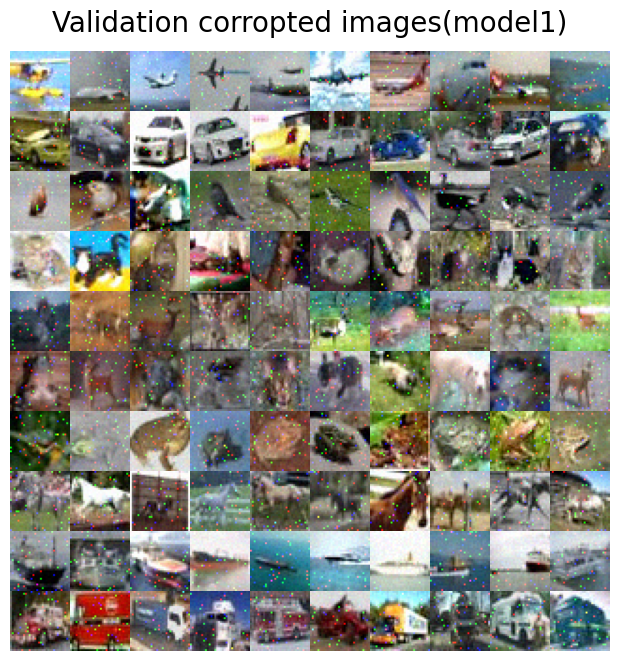

In [10]:
plot_images(dataloader = val_loader_corropted,
            dataloader_title = "Validation corropted images",
            model=resnet18_classifier,
            model_name="model1",
            epsilon=0.1)

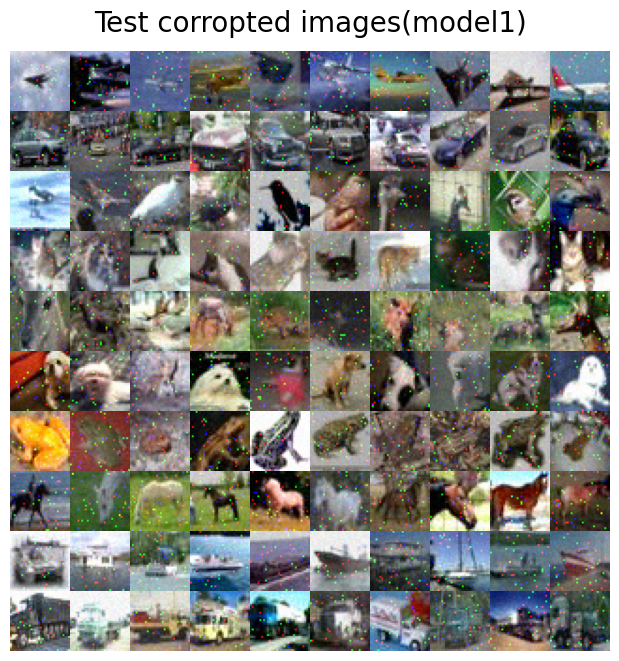

In [11]:
plot_images(dataloader = test_loader_corropted,
            dataloader_title = "Test corropted images",
            model=resnet18_classifier,
            model_name="model1",
            epsilon=0.1)

 60%|██████    | 12/20 [00:05<00:03,  2.36it/s]

100%|██████████| 20/20 [00:09<00:00,  2.18it/s]


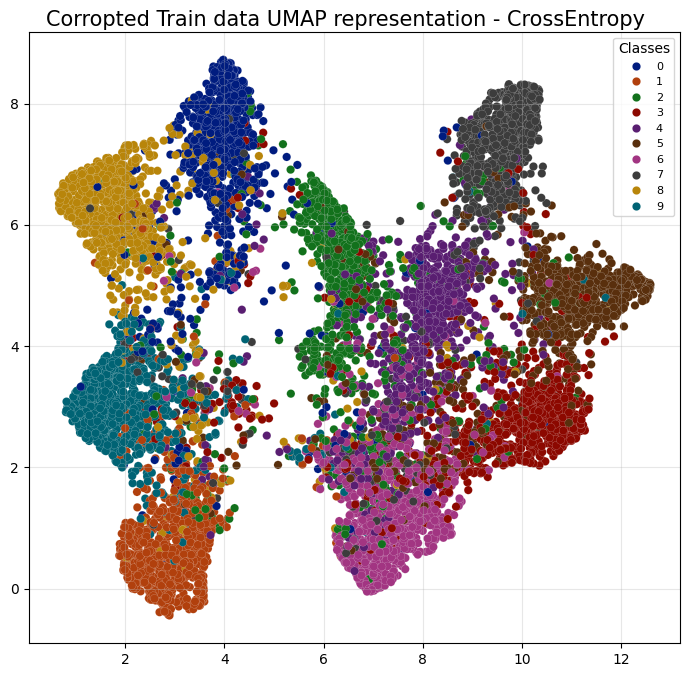

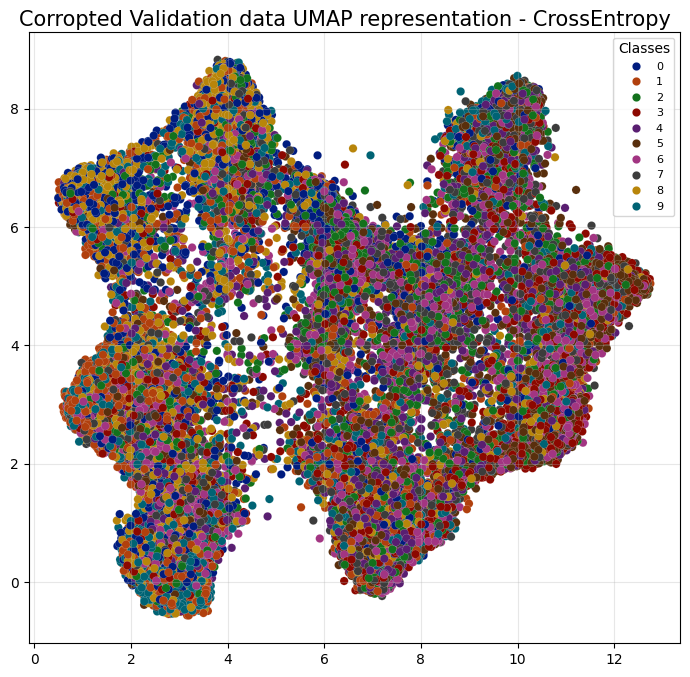

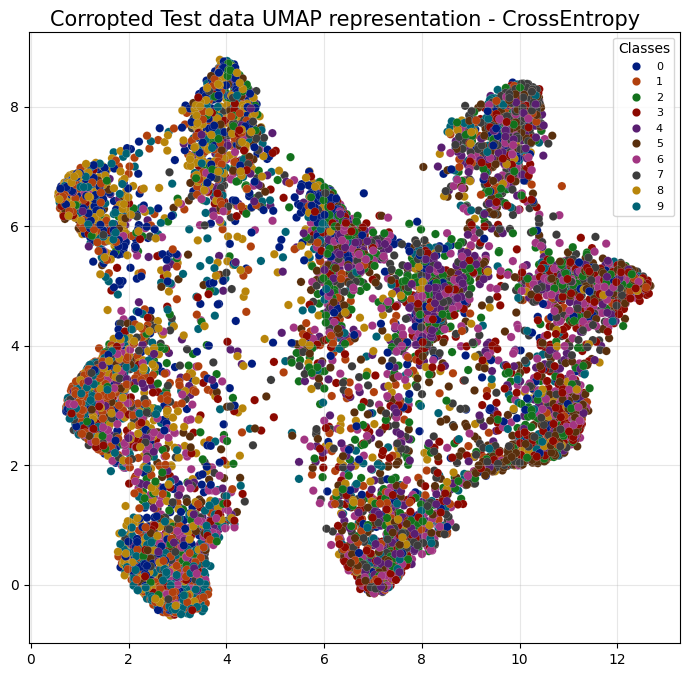

In [12]:
umap_corropted_train_embeddings_resnet18_ce,labels_corropted_train_resnet18_ce,\
umap_corropted_val_embeddings_resnet18_ce,labels_corropted_val_resnet18_ce,\
umap_corropted_test_embeddings_resnet18_ce,labels_corropted_test_resnet18_ce = dataloaders_embedding(
                                                                             model = resnet18_classifier,
                                                                             to_get_umap_representation = True,
                                                                             train_loader = train_loader_corropted,
                                                                             val_loader = val_loader_corropted,
                                                                             test_loader = test_loader_corropted,
                                                                             device = device,
                                                                             train_epsilon = None,
                                                                             test_epsilon = 0.1)


plot_umap(model_name="CrossEntropy",
          data_title="Corropted Train data",
        embeddings_2d = umap_corropted_train_embeddings_resnet18_ce,
        labels = labels_corropted_train_resnet18_ce,
        figsize=(7,7),
        title_fontsize=15,
        title_padding=0.96,
        legend_fontsize=8)

plot_umap(model_name="CrossEntropy",
          data_title="Corropted Validation data",
        embeddings_2d = umap_corropted_val_embeddings_resnet18_ce,
        labels = labels_corropted_val_resnet18_ce,
        figsize=(7,7),
        title_fontsize=15,
        title_padding=0.96,
        legend_fontsize=8)

plot_umap(model_name="CrossEntropy",
          data_title="Corropted Test data",
        embeddings_2d = umap_corropted_test_embeddings_resnet18_ce,
        labels = labels_corropted_test_resnet18_ce,
        figsize=(7,7),
        title_fontsize=15,
        title_padding=0.96,
        legend_fontsize=8)

In [13]:
Inference_mode(model = resnet18_classifier, 
               dataloader= val_loader_corropted,
               dataloader_title="Corropted Validation dataloader",
               device=device,
               criterion=nn.CrossEntropyLoss(),
               embedding=False,
               epsilon=0.1)

Inference mode: :   9%|▉         | 7/80 [00:03<00:33,  2.16it/s, avg_val_loss_till_current_batch=11.2886, loss_batch=11.6954, top1_accuracy_val=18.8000]

Inference mode: : 100%|██████████| 80/80 [00:36<00:00,  2.19it/s, avg_val_loss_till_current_batch=11.4013, loss_batch=11.4266, top1_accuracy_val=18.8950]

Loss on Corropted Validation dataloader: 11.401
Accuracy on Corropted Validation dataloader: 18.895%


(11.401308500766755, 18.89500035047531)

In [14]:
Inference_mode(model = resnet18_classifier, 
               dataloader= test_loader_corropted,
               dataloader_title="Corropted Test dataloader",
               device=device,
               criterion=nn.CrossEntropyLoss(),
               embedding=False,
               epsilon=0.1)

val:   0%|          | 0/20 [00:00<?, ?it/s]

Inference mode: : 100%|██████████| 20/20 [00:09<00:00,  2.18it/s, avg_val_loss_till_current_batch=11.2576, loss_batch=11.0621, top1_accuracy_val=19.3000]

Loss on Corropted Test dataloader: 11.258
Accuracy on Corropted Test dataloader: 19.3%


(11.257614612579346, 19.300000286102296)

## Part4

In [15]:
epochs = 100
learning_rate = 1e-3
gamma=0.95
ckpt_save_freq = 10
embedding = False
epsilon = 0.1
resnet18_robust_classifier = MyResNet18()


resnet18_robust_classifier, resnet18_optimizer_robust_classifier, resnet18_report_robust_classifier = trainer(
                                                                                                train_loader=train_loader_corropted,
                                                                                                val_loader=val_loader_corropted,
                                                                                                model = resnet18_robust_classifier,
                                                                                                embedding = embedding,
                                                                                                epsilon=None,
                                                                                                criterion=criterion,
                                                                                                model_name="resnet18_robust_classifier",
                                                                                                epochs=epochs,
                                                                                                learning_rate=learning_rate,
                                                                                                gamma = gamma,
                                                                                                device=device,
                                                                                                load_saved_model=False,
                                                                                                ckpt_save_freq=ckpt_save_freq,
                                                                                                ckpt_save_root="./ckpts/robust_classifier/",
                                                                                                ckpt_load_path=None,
                                                                                                report_root="./reports")

train:   0%|          | 0/20 [00:00<?, ?it/s]

val:   0%|          | 0/80 [00:00<?, ?it/s]/root/farshad/robust_classifier/learning/learning.py:172: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  report.loc[len(report)] = new_row.values[0]
train:   0%|          | 0/20 [00:00<?, ?it/s]/it]/root/farshad/robust_classifier/learning/learning.py:115: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  report.loc[len(report)] = new_row.values[0]
Train - iteration : 2:   5%|▌         | 1/20 [00:00<00:08,  2.30it/s, avg_train_loss_till_current_batch=1.4470, 

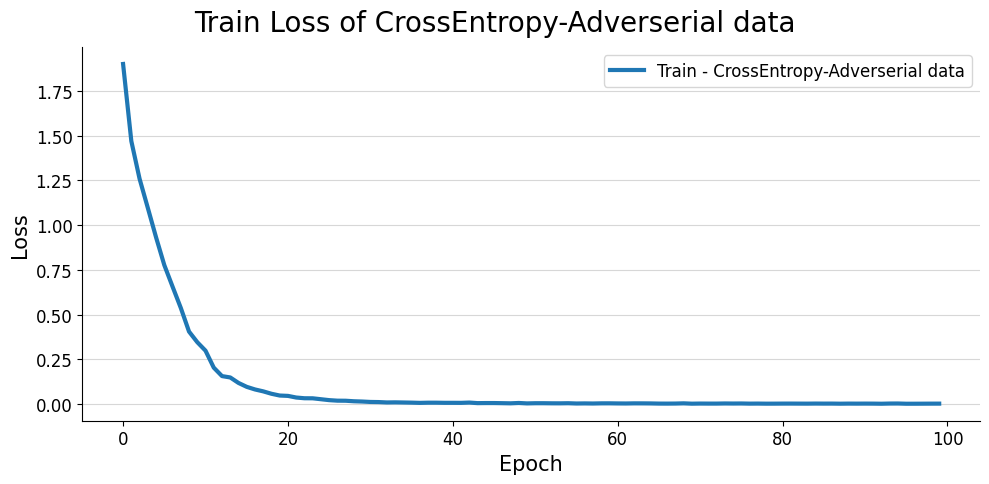

In [16]:
plot_train_val_metric(report_path = "./reports/resnet18_robust_classifier_report.csv",
                      model_name="CrossEntropy-Adverserial data",
                      metric_name="Loss",
                      lst_train_val_cols = ["avg_train_loss_till_current_batch","avg_val_loss_till_current_batch"],
                      figsize=(10,5),
                      linewidth_plot=3,
                      title=None,
                      title_fontsize=20,
                      title_padding=0.96,
                      xy_ticks_fontsize=12,
                      xylabel_fontsize=15,
                      legend_fontsize=12,
                      ylim=None)

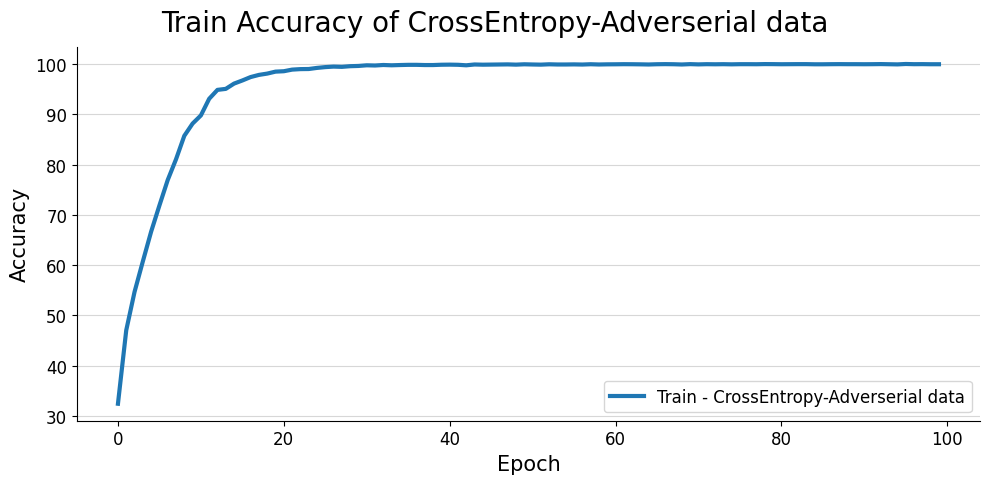

In [17]:
plot_train_val_metric(report_path = "./reports/resnet18_robust_classifier_report.csv",
                      model_name="CrossEntropy-Adverserial data",
                      metric_name="Accuracy",
                      lst_train_val_cols = ["avg_train_top1_acc_till_current_batch","avg_val_top1_acc_till_current_batch"],
                      figsize=(10,5),
                      linewidth_plot=3,
                      title=None,
                      title_fontsize=20,
                      title_padding=0.96,
                      xy_ticks_fontsize=12,
                      xylabel_fontsize=15,
                      legend_fontsize=12,
                      ylim=None)

In [13]:
resnet18_robust_classifier = MyResNet18()
resnet18_robust_classifier,_ = load_model(ckpt_path="./ckpts/robust_classifier/ckpt_resnet18_robust_classifier_epoch100.pth",
                                   model=resnet18_robust_classifier)

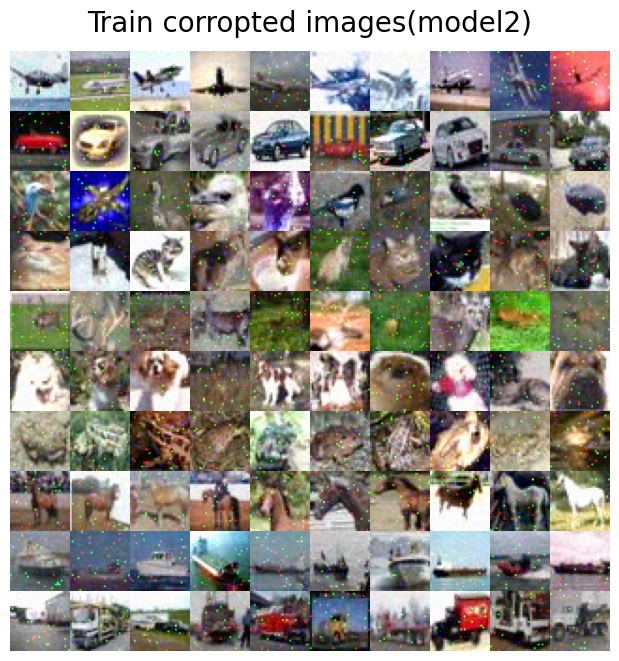

In [19]:
plot_images(dataloader = train_loader_corropted,
            dataloader_title = "Train corropted images",
            model=resnet18_robust_classifier,
            model_name="model2",
            epsilon=0.1)

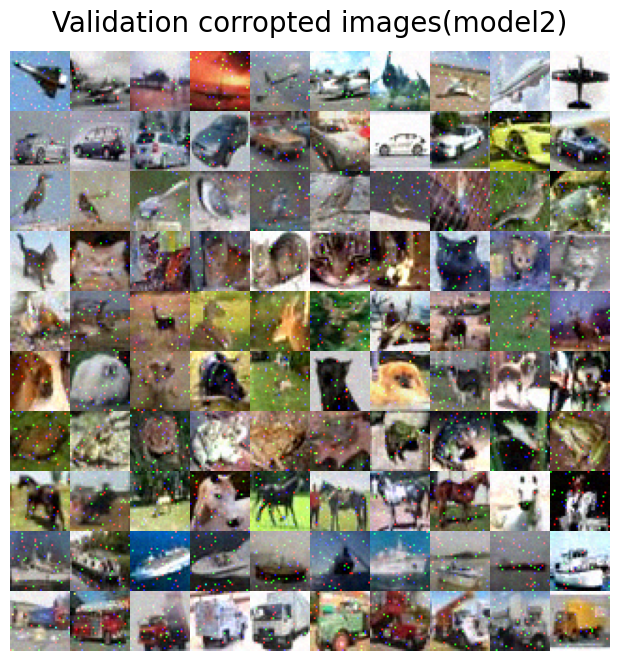

In [20]:
plot_images(dataloader = val_loader_corropted,
            dataloader_title = "Validation corropted images",
            model=resnet18_robust_classifier,
            model_name="model2",
            epsilon=0.1)

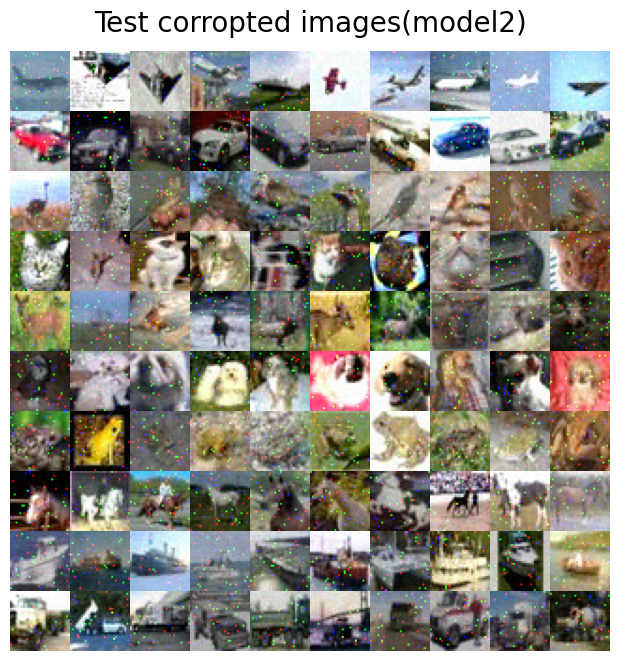

In [21]:
plot_images(dataloader = test_loader_corropted,
            dataloader_title = "Test corropted images",
            model=resnet18_robust_classifier,
            model_name="model2",
            epsilon=0.1)

100%|██████████| 20/20 [00:09<00:00,  2.22it/s]


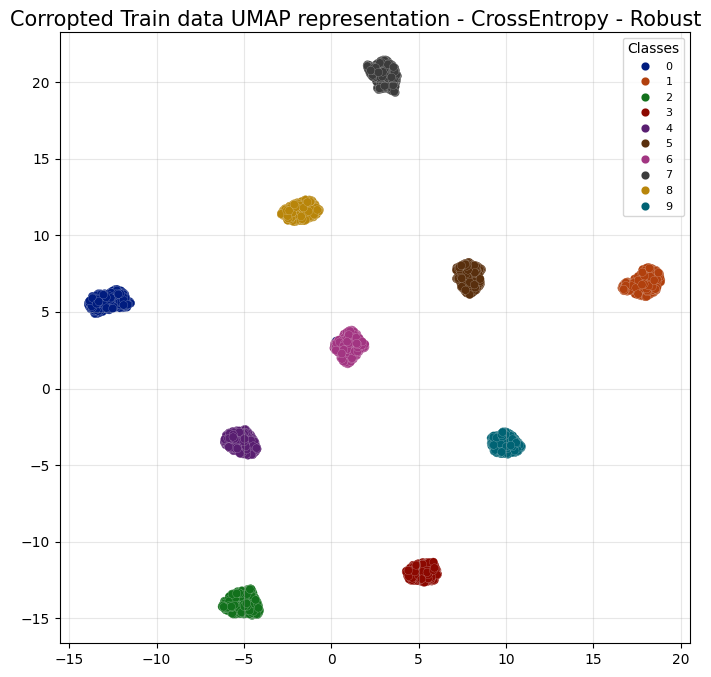

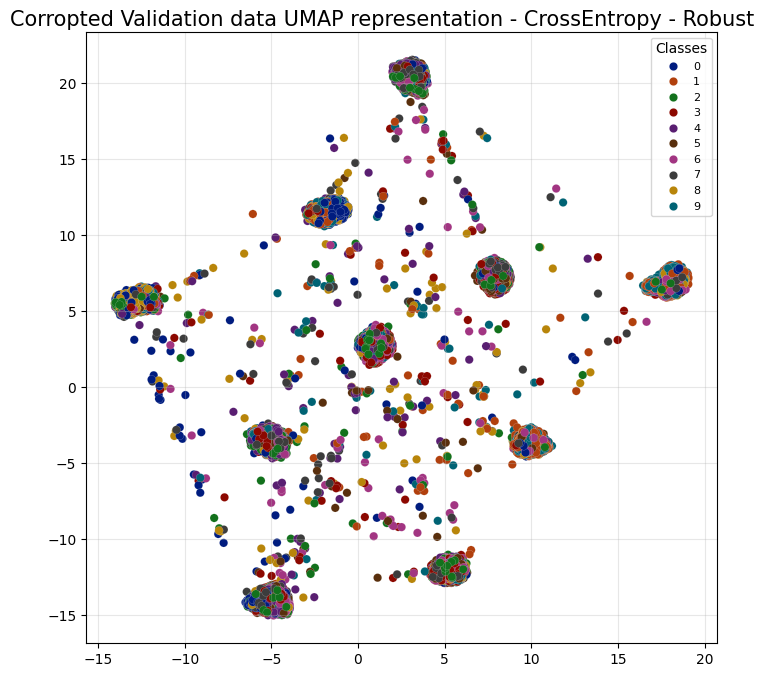

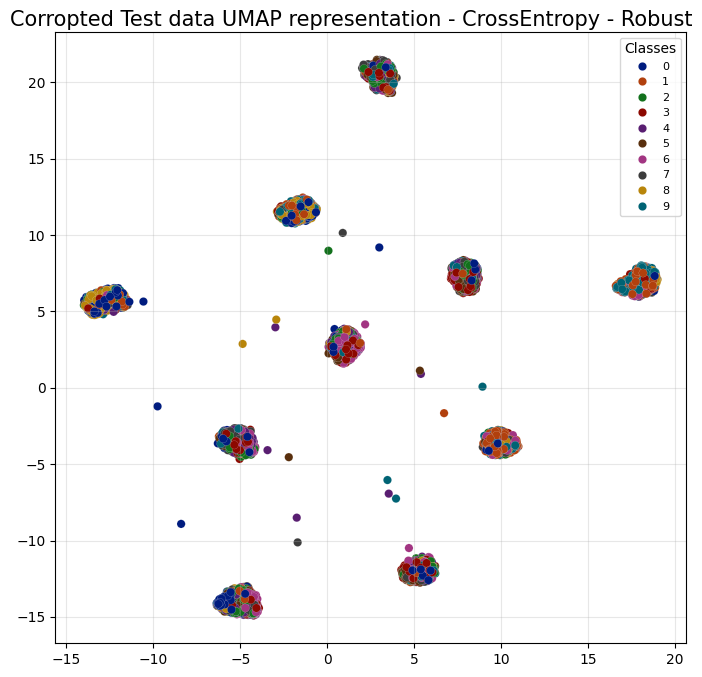

In [22]:
umap_corropted_train_embeddings_resnet18_ce_robust,labels_corropted_train_resnet18_ce_robust,\
umap_corropted_val_embeddings_resnet18_ce_robust,labels_corropted_val_resnet18_ce_robust,\
umap_corropted_test_embeddings_resnet18_ce_robust,labels_corropted_test_resnet18_ce_robust = dataloaders_embedding(
                                                                             model = resnet18_robust_classifier,
                                                                             to_get_umap_representation = True,
                                                                             train_loader = train_loader_corropted,
                                                                             val_loader = val_loader_corropted,
                                                                             test_loader = test_loader_corropted,
                                                                             device = device,
                                                                             train_epsilon = None,
                                                                             test_epsilon = 0.1)


plot_umap(model_name="CrossEntropy - Robust",
          data_title="Corropted Train data",
          embeddings_2d = umap_corropted_train_embeddings_resnet18_ce_robust,
          labels = labels_corropted_train_resnet18_ce_robust,
          figsize=(7,7),
          title_fontsize=15,
          title_padding=0.96,
          legend_fontsize=8)


plot_umap(model_name="CrossEntropy - Robust",
          data_title="Corropted Validation data",
          embeddings_2d = umap_corropted_val_embeddings_resnet18_ce_robust,
          labels = labels_corropted_val_resnet18_ce_robust,
          figsize=(7,7),
          title_fontsize=15,
          title_padding=0.96,
          legend_fontsize=8)

plot_umap(model_name="CrossEntropy - Robust",
          data_title="Corropted Test data",
          embeddings_2d = umap_corropted_test_embeddings_resnet18_ce_robust,
          labels = labels_corropted_test_resnet18_ce_robust,
          figsize=(7,7),
          title_fontsize=15,
          title_padding=0.96,
          legend_fontsize=8)

In [23]:
Inference_mode(model = resnet18_robust_classifier, 
               dataloader= val_loader_corropted,
               dataloader_title="Corropted Validation dataloader",
               device=device,
               criterion=nn.CrossEntropyLoss(),
               embedding=False,
               epsilon=0.1)

Inference mode: : 100%|██████████| 80/80 [00:36<00:00,  2.16it/s, avg_val_loss_till_current_batch=9.8836, loss_batch=9.9787, top1_accuracy_val=19.3575] 

Loss on Corropted Validation dataloader: 9.884
Accuracy on Corropted Validation dataloader: 19.358%


(9.883648943901061, 19.357500422000886)

In [24]:
Inference_mode(model = resnet18_robust_classifier, 
               dataloader= test_loader_corropted,
               dataloader_title="Corropted Test dataloader",
               device=device,
               criterion=nn.CrossEntropyLoss(),
               embedding=False,
               epsilon=0.1)

Inference mode: : 100%|██████████| 20/20 [00:09<00:00,  2.16it/s, avg_val_loss_till_current_batch=9.8775, loss_batch=10.0474, top1_accuracy_val=19.4000]

Loss on Corropted Test dataloader: 9.877
Accuracy on Corropted Test dataloader: 19.4%


(9.877487134933471, 19.40000033378601)

## Part5

* NO CODE NEEDED FOR THIS PART :))

## Part6

In [21]:
alpha = 45
epochs = 50
learning_rate = 1e-3
# gamma=0.95
gamma=0.80
# gamma=80
ckpt_save_freq = 10
embedding = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


from pytorch_metric_learning.losses import  CircleLoss
# criterion=AngularLoss(alpha=alpha)

criterion = CircleLoss(m=0.8, gamma=80)
resnet18_angular = MyResNet18(embedding_reduction=True)

resnet18_angular, resnet18_optimizer_angular, resnet18_report_angular = trainer(
                                                                                train_loader=train_loader_clean,
                                                                                val_loader=val_loader_clean,
                                                                                model = resnet18_angular,
                                                                                embedding = embedding,
                                                                                epsilon=0.1,
                                                                                criterion=criterion,
                                                                                model_name="resnet18_angular",
                                                                                epochs=epochs,
                                                                                learning_rate=learning_rate,
                                                                                gamma = gamma,
                                                                                device=device,
                                                                                load_saved_model=False,
                                                                                ckpt_save_freq=ckpt_save_freq,
                                                                                ckpt_save_root="./ckpts/angular/",
                                                                                ckpt_load_path=None,
                                                                                report_root="./reports")

Train - iteration : 1:  40%|████      | 8/20 [00:01<00:02,  5.09it/s, avg_train_loss_till_current_batch=0.0006, loss_batch=0.0000, max_len=2, top1_accuracy_train=0.1000]

val:   0%|          | 0/80 [00:00<?, ?it/s]/root/farshad/robust_classifier/learning/learning.py:172: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  report.loc[len(report)] = new_row.values[0]
train:   0%|          | 0/20 [00:00<?, ?it/s]]/root/farshad/robust_classifier/learning/learning.py:115: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  report.loc[len(report)] = new_row.values[0]
Train - iteration : 2:   5%|▌         | 1/20 [00:00<00:03,  5.10it/s, avg_train_loss_till_current_batch=0.0000, los

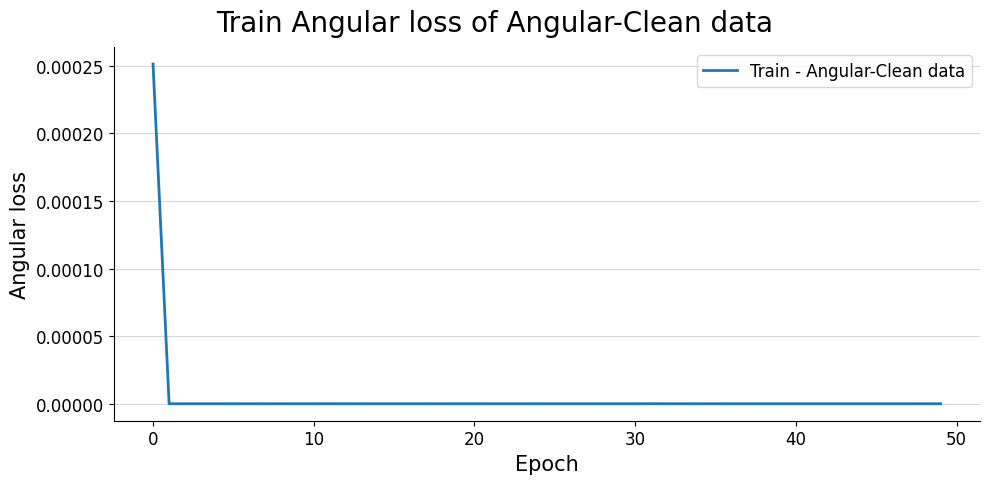

In [22]:
plot_train_val_metric(report_path = "./reports/resnet18_angular_report.csv",
                      model_name="Angular-Clean data",
                      metric_name="Angular loss",
                      lst_train_val_cols = ["avg_train_loss_till_current_batch","avg_val_loss_till_current_batch"],
                      figsize=(10,5),
                      linewidth_plot=2,
                      title=None,
                      title_fontsize=20,
                      title_padding=0.96,
                      xy_ticks_fontsize=12,
                      xylabel_fontsize=15,
                      legend_fontsize=12,
                      ylim=None)

In [23]:
resnet18_angular = MyResNet18()
resnet18_angular = MyResNet18(embedding_reduction=True)
resnet18_angular,_ = load_model(ckpt_path="./ckpts/angular/ckpt_resnet18_angular_epoch50.pth",
                                   model=resnet18_angular)

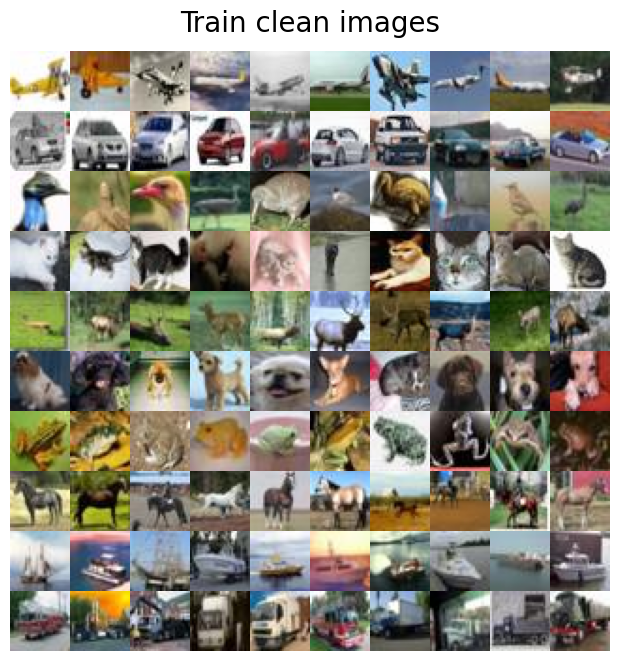

In [24]:
plot_images(dataloader = train_loader_clean,
            dataloader_title = "Train clean images",
            model=resnet18_robust_classifier,
            model_name=None,
            epsilon=None)

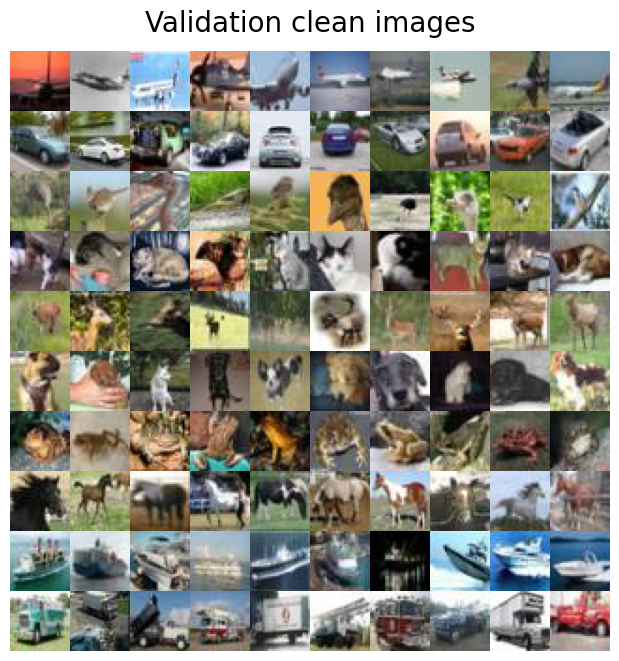

In [25]:
plot_images(dataloader = val_loader_clean,
            dataloader_title = "Validation clean images",
            model=resnet18_robust_classifier,
            model_name=None,
            epsilon=None)

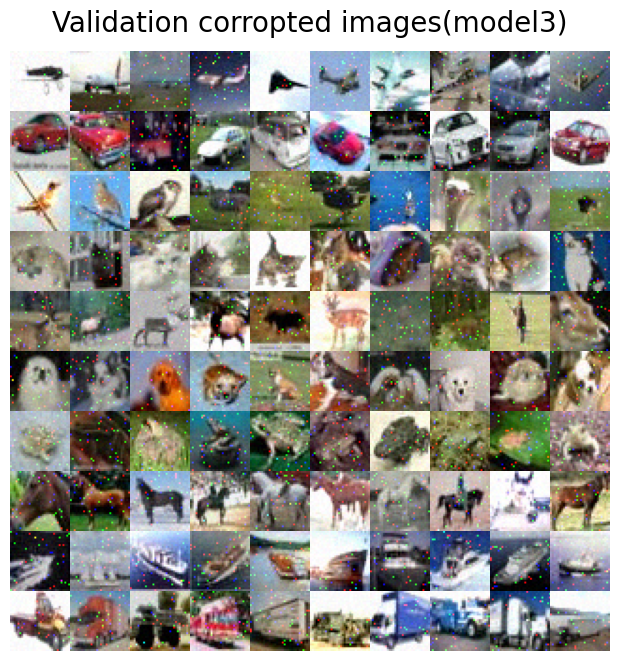

In [26]:
plot_images(dataloader = val_loader_corropted,
            dataloader_title = "Validation corropted images",
            model=resnet18_angular,
            model_name="model3",
            epsilon=0.1)

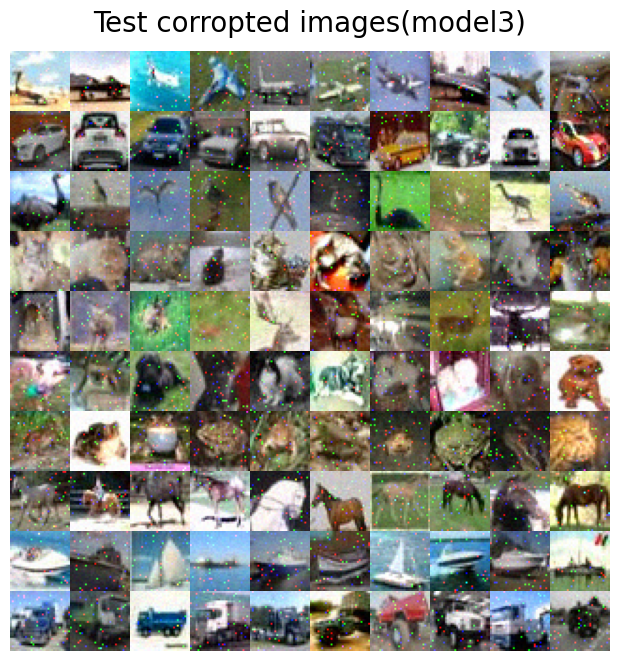

In [27]:
plot_images(dataloader = test_loader_corropted,
            dataloader_title = "Test corropted images",
            model=resnet18_angular,
            model_name="model3",
            epsilon=0.1)

  9%|▉         | 7/80 [00:01<00:11,  6.55it/s]

100%|██████████| 20/20 [00:02<00:00,  7.14it/s]


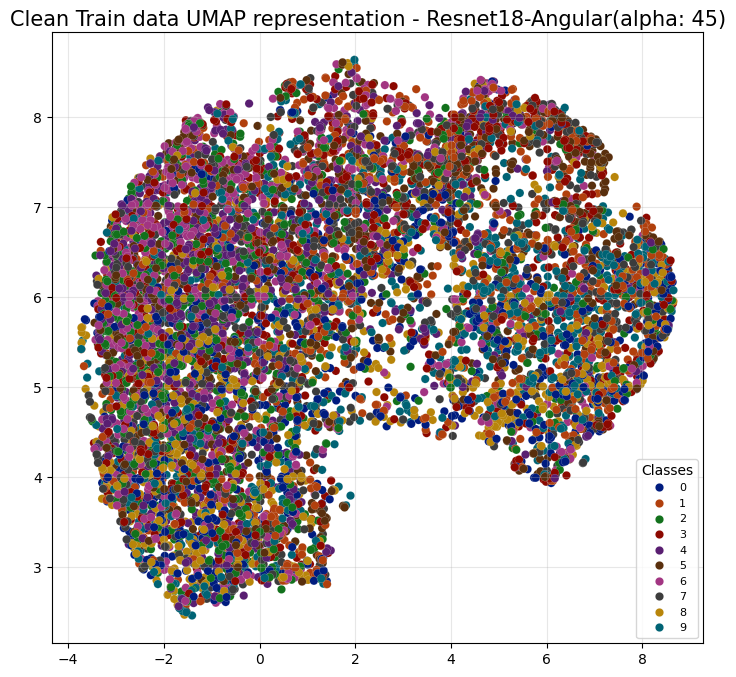

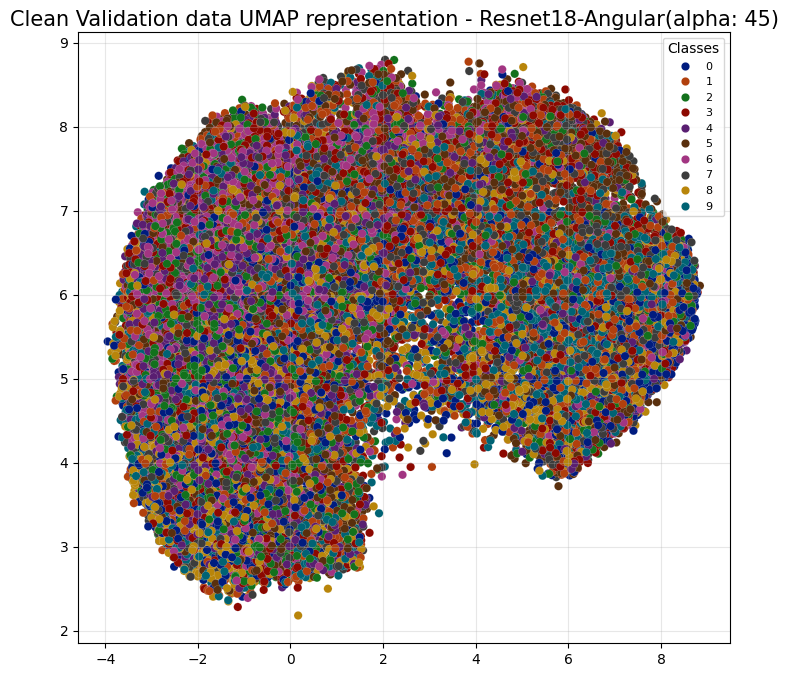

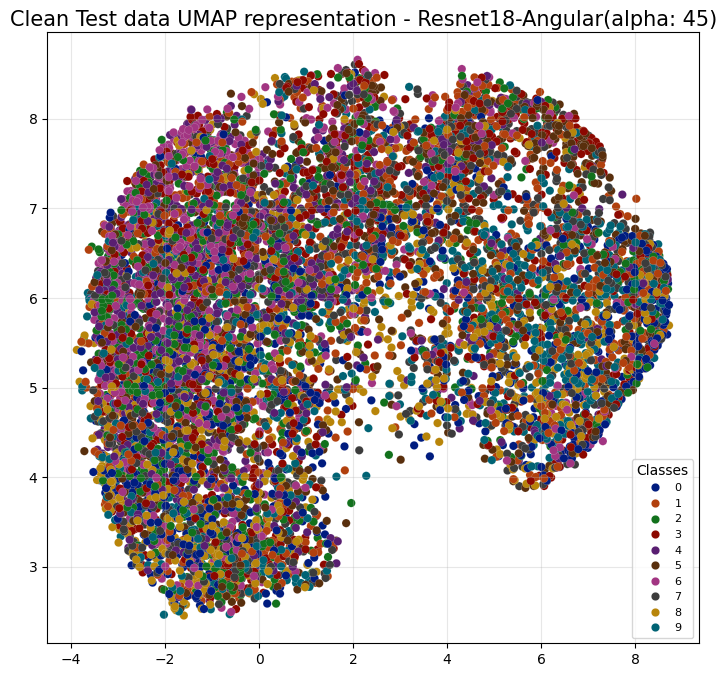

In [28]:
umap_clean_train_embeddings_angular,labels_clean_train_angular,\
umap_clean_val_embeddings_angular,labels_clean_val_angular,\
umap_clean_test_embeddings_angular,labels_clean_test_angular = dataloaders_embedding(
                                                                             model = resnet18_angular,
                                                                             to_get_umap_representation = True,
                                                                             train_loader = train_loader_clean,
                                                                             val_loader = val_loader_clean,
                                                                             test_loader = test_loader_clean,
                                                                             device = device,
                                                                             train_epsilon = None,
                                                                             test_epsilon = None)


plot_umap(model_name=f"Resnet18-Angular(alpha: {alpha})",
          data_title="Clean Train data",
          embeddings_2d = umap_clean_train_embeddings_angular,
          labels = labels_clean_train_angular,
          figsize=(7,7),
          title_fontsize=15,
          title_padding=0.96,
          legend_fontsize=8)

plot_umap(model_name=f"Resnet18-Angular(alpha: {alpha})",
          data_title="Clean Validation data",
          embeddings_2d = umap_clean_val_embeddings_angular,
          labels = labels_clean_val_angular,
          figsize=(7,7),
          title_fontsize=15,
          title_padding=0.96,
          legend_fontsize=8)

plot_umap(model_name=f"Resnet18-Angular(alpha: {alpha})",
          data_title="Clean Test data",
          embeddings_2d = umap_clean_test_embeddings_angular,
          labels = labels_clean_test_angular,
          figsize=(7,7),
          title_fontsize=15,
          title_padding=0.96,
          legend_fontsize=8)

 35%|███▌      | 7/20 [00:01<00:01,  6.95it/s]

100%|██████████| 20/20 [00:09<00:00,  2.15it/s]


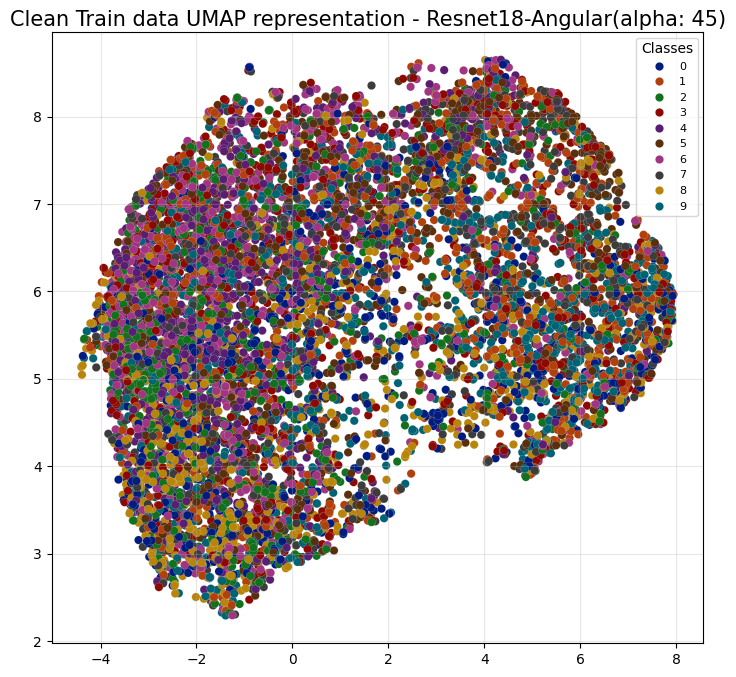

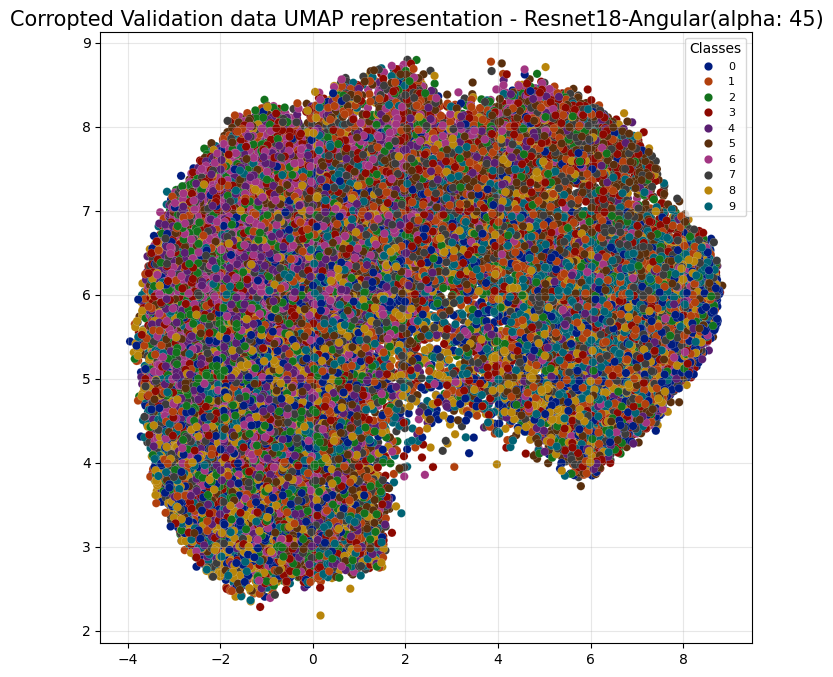

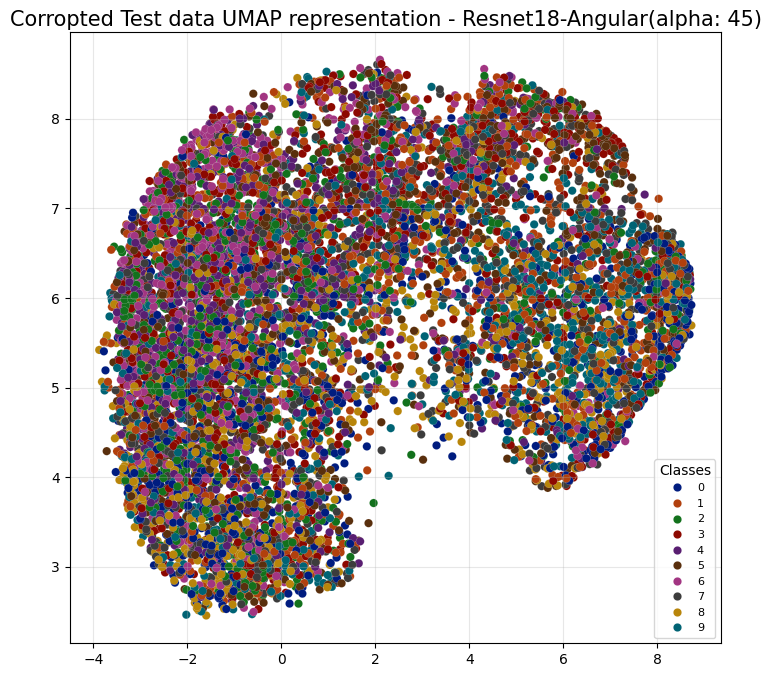

In [29]:
umap_clean_train_embeddings_angular,labels_clean_train_angular,\
umap_corropted_val_embeddings_angular,labels_corropted_val_angular,\
umap_corropted_test_embeddings_angular,labels_corropted_test_angular = dataloaders_embedding(
                                                                             model = resnet18_angular,
                                                                             to_get_umap_representation = True,
                                                                             train_loader = train_loader_clean,
                                                                             val_loader = val_loader_corropted,
                                                                             test_loader = test_loader_corropted,
                                                                             device = device,
                                                                             train_epsilon = None,
                                                                             test_epsilon = 0.1)


plot_umap(model_name=f"Resnet18-Angular(alpha: {alpha})",
          data_title="Clean Train data",
          embeddings_2d = umap_clean_train_embeddings_angular,
          labels = labels_clean_train_angular,
          figsize=(7,7),
          title_fontsize=15,
          title_padding=0.96,
          legend_fontsize=8)


plot_umap(model_name=f"Resnet18-Angular(alpha: {alpha})",
          data_title="Corropted Validation data",
          embeddings_2d = umap_clean_val_embeddings_angular,
          labels = labels_clean_val_angular,
          figsize=(7,7),
          title_fontsize=15,
          title_padding=0.96,
          legend_fontsize=8)

plot_umap(model_name=f"Resnet18-Angular(alpha: {alpha})",
          data_title="Corropted Test data",
          embeddings_2d = umap_clean_test_embeddings_angular,
          labels = labels_clean_test_angular,
          figsize=(7,7),
          title_fontsize=15,
          title_padding=0.96,
          legend_fontsize=8)

In [30]:
n_neighbors =6  

backbone_clean_train_embeddings_angular,labels_clean_train_angular,\
backbone_clean_val_embeddings_angular,labels_clean_val_angular,\
backbone_clean_test_embeddings_angular,labels_clean_test_angular = dataloaders_embedding(
                                                                             model = resnet18_angular,
                                                                             to_get_umap_representation = False,
                                                                             train_loader = train_loader_clean,
                                                                             val_loader = val_loader_clean,
                                                                             test_loader = test_loader_clean,
                                                                             device = device,
                                                                             train_epsilon = None,
                                                                             test_epsilon = None)


backbone_corropted_train_embeddings_angular,labels_corropted_train_angular,\
backbone_corropted_val_embeddings_angular,labels_corropted_val_angular,\
backbone_corropted_test_embeddings_angular,labels_corropted_test_angular = dataloaders_embedding(
                                                                             model = resnet18_angular,
                                                                             to_get_umap_representation = False,
                                                                             train_loader = train_loader_corropted,
                                                                             val_loader = val_loader_corropted,
                                                                             test_loader = test_loader_corropted,
                                                                             device = device,
                                                                             train_epsilon = None,
                                                                             test_epsilon = 0.1)



knn_model = KNN_classifier(model = None,
                           X_train = backbone_clean_train_embeddings_angular, y_train = labels_clean_train_angular,
                           X_test = backbone_clean_val_embeddings_angular, y_test = labels_clean_val_angular, n_neighbors =n_neighbors,
                           test_data_title = "Clean Validation dataloader")

knn_model = KNN_classifier(model = knn_model,
                           X_train = backbone_clean_train_embeddings_angular, y_train = labels_clean_train_angular,
                           X_test = backbone_clean_test_embeddings_angular, y_test = labels_clean_test_angular, n_neighbors =n_neighbors,
                           test_data_title = "Clean Test dataloader")


knn_model = KNN_classifier(model = knn_model,
                           X_train = backbone_clean_train_embeddings_angular, y_train = labels_clean_train_angular,
                           X_test = backbone_corropted_val_embeddings_angular, y_test = labels_corropted_val_angular, n_neighbors =n_neighbors,
                           test_data_title = "Corropted Validation dataloader")

knn_model = KNN_classifier(model = knn_model,
                           X_train = backbone_clean_train_embeddings_angular, y_train = labels_clean_test_angular,
                           X_test = backbone_corropted_test_embeddings_angular, y_test = labels_corropted_test_angular, n_neighbors =n_neighbors,
                           test_data_title = "Corropted Test dataloader")

  0%|          | 0/80 [00:00<?, ?it/s]

100%|██████████| 20/20 [00:09<00:00,  2.14it/s]


Accuracy of on Clean Validation dataloader: 22%
Accuracy of on Clean Test dataloader: 22%
Accuracy of on Corropted Validation dataloader: 17%
Accuracy of on Corropted Test dataloader: 17%
